In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from pyhdf.SD import SD, SDC
from osgeo import gdal

In [26]:
import copy

In [53]:
import tensorflow as tf
from matplotlib import patches as mpl_patches
from matplotlib.colors import Colormap
from sklearn.cluster import  AgglomerativeClustering

In [86]:
import itertools

check downloaded data by ricardo and try to compare datset

## MOD09 data from gee

In [2]:
gee_datadir = '/project/foster/clouds/data/gee/closed_open_cell/2017_01_MOD09GA'

In [5]:
mod09_swath = gdal.Open(gee_datadir+'/2017-01-01_MOD09GA_closed-cell.tif')

In [6]:
mod09_data = mod09_swath.ReadAsArray()
mod09_data = np.rollaxis(mod09_data, 0, 3)

In [7]:
mod09_data.shape

(1140, 1146, 7)

In [8]:
! gdalinfo "/project/foster/clouds/data/gee/closed_open_cell/2017_01_MOD09GA/2017-01-01_MOD09GA_closed-cell.tif"

Driver: GTiff/GeoTIFF
Files: /project/foster/clouds/data/gee/closed_open_cell/2017_01_MOD09GA/2017-01-01_MOD09GA_closed-cell.tif
Size is 1146, 1140
Coordinate System is:
GEOGCS["WGS 84",
    DATUM["WGS_1984",
        SPHEROID["WGS 84",6378137,298.257223563,
            AUTHORITY["EPSG","7030"]],
        AUTHORITY["EPSG","6326"]],
    PRIMEM["Greenwich",0],
    UNIT["degree",0.0174532925199433],
    AUTHORITY["EPSG","4326"]]
Origin = (-170.706853441232681,37.693309321655121)
Pixel Size = (0.004491576420598,-0.004491576420598)
Metadata:
  AREA_OR_POINT=Area
Image Structure Metadata:
  COMPRESSION=LZW
  INTERLEAVE=PIXEL
Corner Coordinates:
Upper Left  (-170.7068534,  37.6933093) (170d42'24.67"W, 37d41'35.91"N)
Lower Left  (-170.7068534,  32.5729122) (170d42'24.67"W, 32d34'22.48"N)
Upper Right (-165.5595069,  37.6933093) (165d33'34.22"W, 37d41'35.91"N)
Lower Right (-165.5595069,  32.5729122) (165d33'34.22"W, 32d34'22.48"N)
Center      (-168.1331802,  35.1331108) (168d 7'59.45"W, 35d 7'59.2

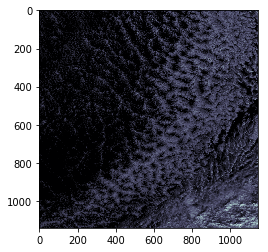

In [9]:
plt.figure()
plt.imshow(mod09_data[:,:,0], cmap='bone')

In [23]:
mod09_data.shape

(1140, 1146, 7)

## MOD06

In [21]:
filelist=[
    "Cloud_Optical_Thickness_16-Cloud_Optical_Thickness_16",
    "Cloud_Phase_Infrared-Cloud_Phase_Infrared",
    "Cloud_Effective_Radius_1621-Cloud_Effective_Radius_1621",
    "Cloud_Water_Path_16-Cloud_Water_Path_16",
    "Cloud_Top_Temperature_Night-Cloud_Top_Temperature_Night",
    "Cloud_Top_Pressure_Nadir-Cloud_Top_Pressure_Nadir",
    "Cloud_Effective_Emissivity-Cloud_Effective_Emissivity",
    "Cloud_Top_Height-Cloud_Top_Height"
]

In [13]:
def _load_tif_data(inputfilename):
    mod06_tif_dir = '/home/tkurihana/scratch-midway2/data/MOD06/05'
    basename = 'MOD06_L2.A2017001.mosaic.061.2019009170729.sggs_000501293991.'
    mod06_swath =  gdal.Open(mod06_tif_dir+"/"+basename+inputfilename+'.tif')
    print('variable : %s' % inputfilename )
    return mod06_swath.ReadAsArray()

In [24]:
cot_data = _load_tif_data("Cloud_Optical_Thickness_16-Cloud_Optical_Thickness_16")
print(cot_data.shape)

variable : Cloud_Optical_Thickness_16-Cloud_Optical_Thickness_16
(569, 574)


In [25]:
cot_data.shape[0]*2, cot_data.shape[1]*2

(1138, 1148)

variable : Cloud_Optical_Thickness_16-Cloud_Optical_Thickness_16


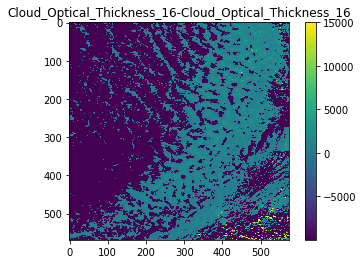

variable : Cloud_Phase_Infrared-Cloud_Phase_Infrared


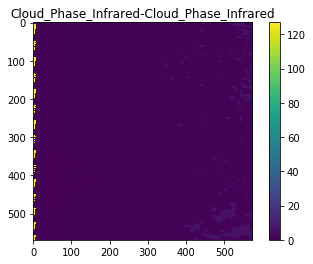

variable : Cloud_Effective_Radius_1621-Cloud_Effective_Radius_1621


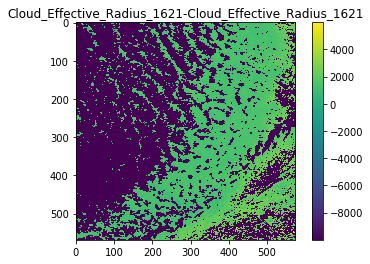

variable : Cloud_Water_Path_16-Cloud_Water_Path_16


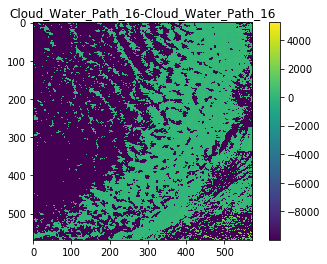

variable : Cloud_Top_Temperature_Night-Cloud_Top_Temperature_Night


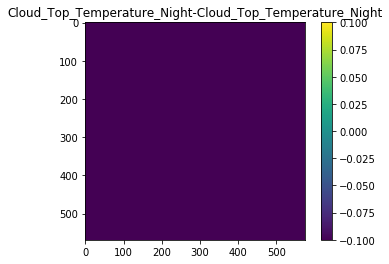

variable : Cloud_Top_Pressure_Nadir-Cloud_Top_Pressure_Nadir


/home/tkurihana/.conda/envs/py3501/lib/python3.6/site-packages/matplotlib/transforms.py:2943: RuntimeWarning: overflow encountered in short_scalars
  elif vmax - vmin <= maxabsvalue * tiny:


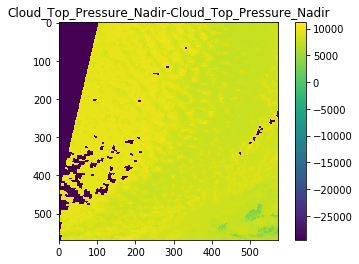

variable : Cloud_Effective_Emissivity-Cloud_Effective_Emissivity


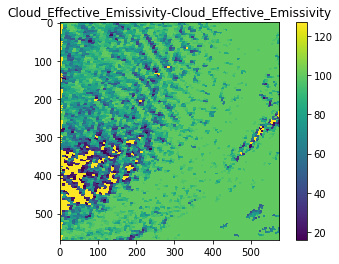

variable : Cloud_Top_Height-Cloud_Top_Height


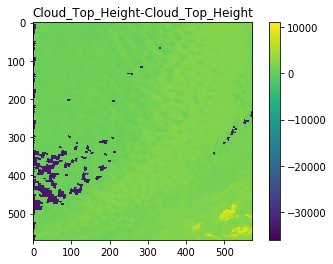

In [22]:
for ifile in filelist:
    _data = _load_tif_data(ifile)
    plt.figure()
    plt.title(str(ifile))
    plt.imshow(_data)
    plt.colorbar()
    plt.show()

## Interpolation

In [49]:
# interpolation
def _interpolation(array, xsize=0, ysize=0):
    """ Interpolate mod09 and mod06 data
        Ignore few pixcels difference for preliminary interpolation
        array: mod06 data
        xsize: mod09 data shape[0]
        ysize: mod09 data shape[1]
    """
    _x = array.shape[0]
    _y = array.shape[1]
    amp_array = np.zeros((xsize, ysize)) # same shape as mod09 data
    for ix in range(xsize):
        for iy in range(ysize):
            if ix+1 < _x and iy+1 < _y:
                amp_array[2*ix, 2*iy] = array[ix, iy]
                amp_array[2*ix+1, 2*iy+1] = array[ix, iy]
                amp_array[2*ix, 2*iy+1] = array[ix, iy]
                amp_array[2*ix+1, 2*iy] = array[ix, iy]
    return amp_array

In [28]:
cot_data = _load_tif_data("Cloud_Optical_Thickness_16-Cloud_Optical_Thickness_16")

variable : Cloud_Optical_Thickness_16-Cloud_Optical_Thickness_16


In [50]:
int_cot_data = _interpolation(cot_data, xsize=mod09_data.shape[0], ysize=mod09_data.shape[1])

In [52]:
int_cot_data.shape

(1140, 1146)

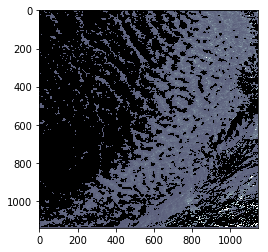

In [51]:
plt.figure()
plt.imshow(int_cot_data, cmap='bone')

## Clustering

In [54]:
model_dir = "/home/tkurihana/clouds/output/m9-22_oceans/"
ENCODER_DEF=model_dir+'encoder.json'
ENCODER_WEIGHTS=model_dir+'encoder.h5'
with open(ENCODER_DEF,"r") as f:
    encoder = tf.keras.models.model_from_json(f.read())
encoder.load_weights(ENCODER_WEIGHTS)

/home/tkurihana/.conda/envs/py3501/lib/python3.6/site-packages/tensorflow/python/keras/layers/core.py:791: UserWarning: models is not loaded, but a Lambda layer uses it. It may cause errors.
  , UserWarning)


In [55]:
SHAPE = 128, 128, 7

In [56]:
# Color scheme by Ricardo
colors = ["#833f2c",
"#016dec",
"#5cb925",
"#e125a2",
"#2f8900",
"#ff95f9",
"#009650",
"#bb0075",
"#8bd890",
"#d30063",
"#00c7b1",
"#e63e2c",
"#029ebe",
"#f0ae00",
"#b98fff",
"#e1c54c",
"#6e3c92",
"#7ad8b4",
"#ff5655",
"#375c16",
"#ff5677",
"#75481c",
"#ffa2d2",
"#9b280d",
"#ffa47a",
"#952f23",
"#ff804b"]

In [57]:
def _gen_patches(img, stride=128, size=128):
    # generate swath again
    swath = img   
    swath_mean = swath.mean(axis=(0,1))
    swath_std = swath.std(axis=(0,1))
    patches = []

    stride = stride
    patch_size = size

    patches = []
    for i in range(0, swath.shape[0], stride):
        row = []
        for j in range(0, swath.shape[1], stride):
            if i + patch_size <= swath.shape[0] and j + patch_size <= swath.shape[1]:
                p = swath[i:i + patch_size, j:j + patch_size].astype(float)
                p -= swath_mean
                p /= swath_std
            
                row.append(p)
        if row:
            patches.append(row)
            
    return np.stack(patches)

In [58]:
def _anl_agl(encoder, patches, clusters=0):
    # clustering
    _encs = encoder.predict(patches.reshape((-1, 128, 128, 7)))
    method = AgglomerativeClustering(n_clusters=clusters)
    features = _encs.mean(axis=(1,2))
    patches_labels = method.fit_predict(features).reshape(patches.shape[:2])
    return patches_labels

In [60]:
def cluster_plotting(swath, patches,patches_labels, SHAPE, colors, ncluster=0):
    line_width = 4
    fig, a = plt.subplots(figsize=(20,20))
    plt.imshow(swath[:,:,0], cmap="bone")
    rects = []   
    for i in range(patches.shape[0]):
        for j in range(patches.shape[1]):
            a.add_patch(mpl_patches.Rectangle(
                (j * SHAPE[0] + line_width , i * SHAPE[1] + line_width ),
                width=SHAPE[0] - line_width * 2,
                height=SHAPE[1] - line_width * 2,
                linewidth=6,
                edgecolor=colors[patches_labels[i,j]],
                facecolor="none"
            ))
            centerx = SHAPE[0]*0.5*(2*j+1) #+1
            centery = SHAPE[1]*0.5*(2*i+1) #+1
            # add label as text
            plt.text(centerx, centery, str(patches_labels[i,j]), 
                 fontsize=20,weight='bold', 
                 color=colors[patches_labels[i,j]])
    plt.title(" ## %d cluster ## " %ncluster, fontsize=20)
    plt.show()

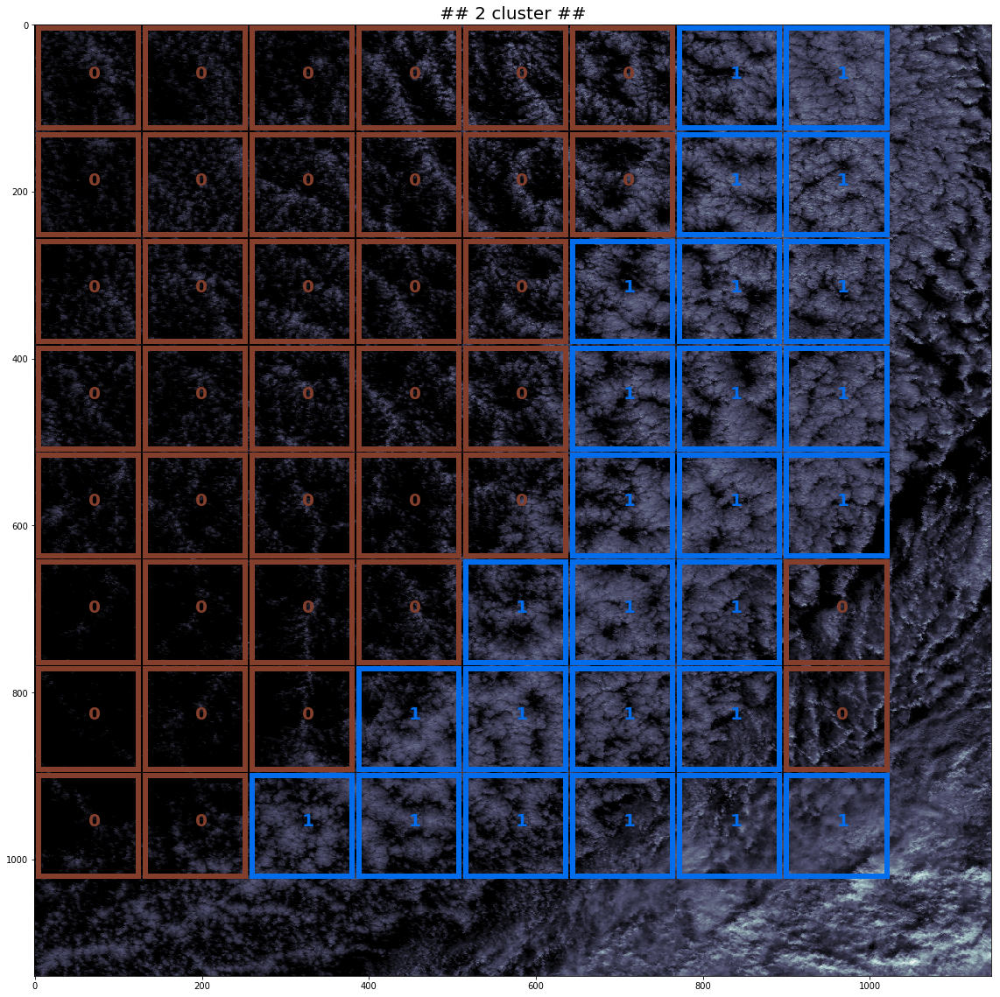

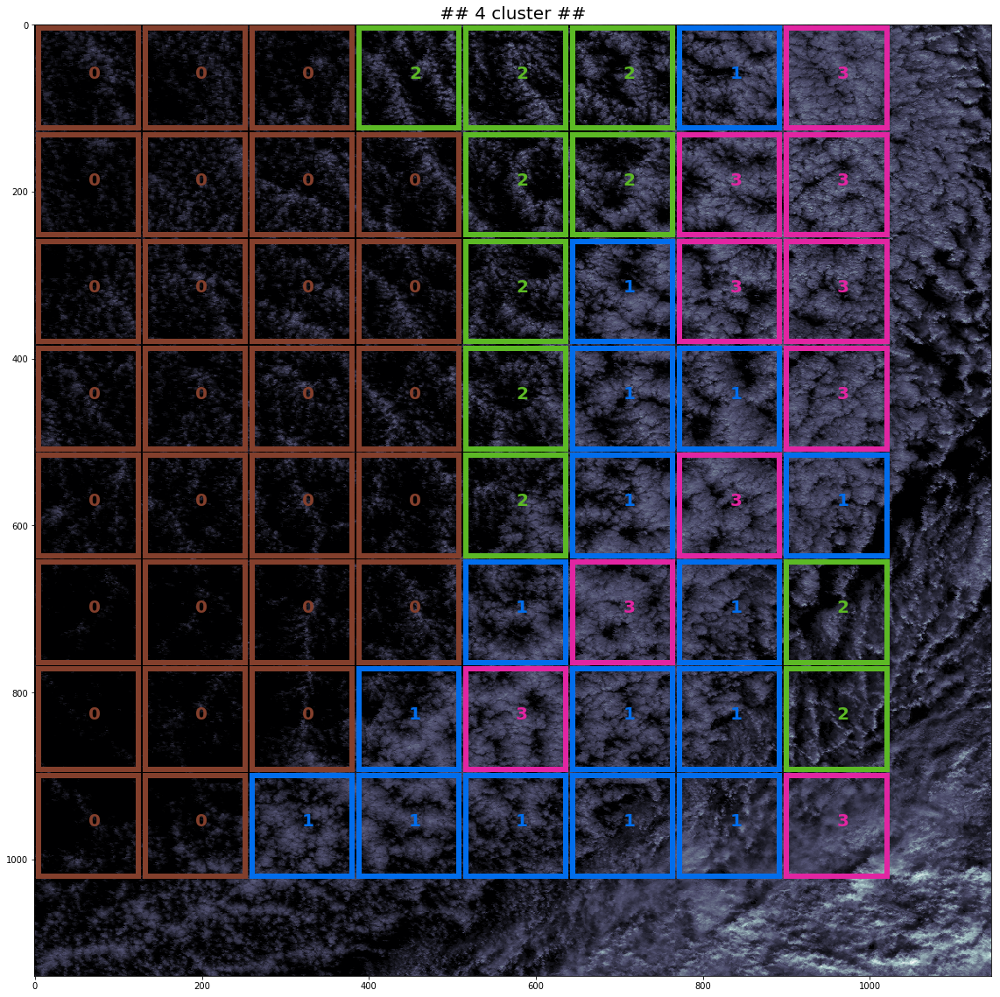

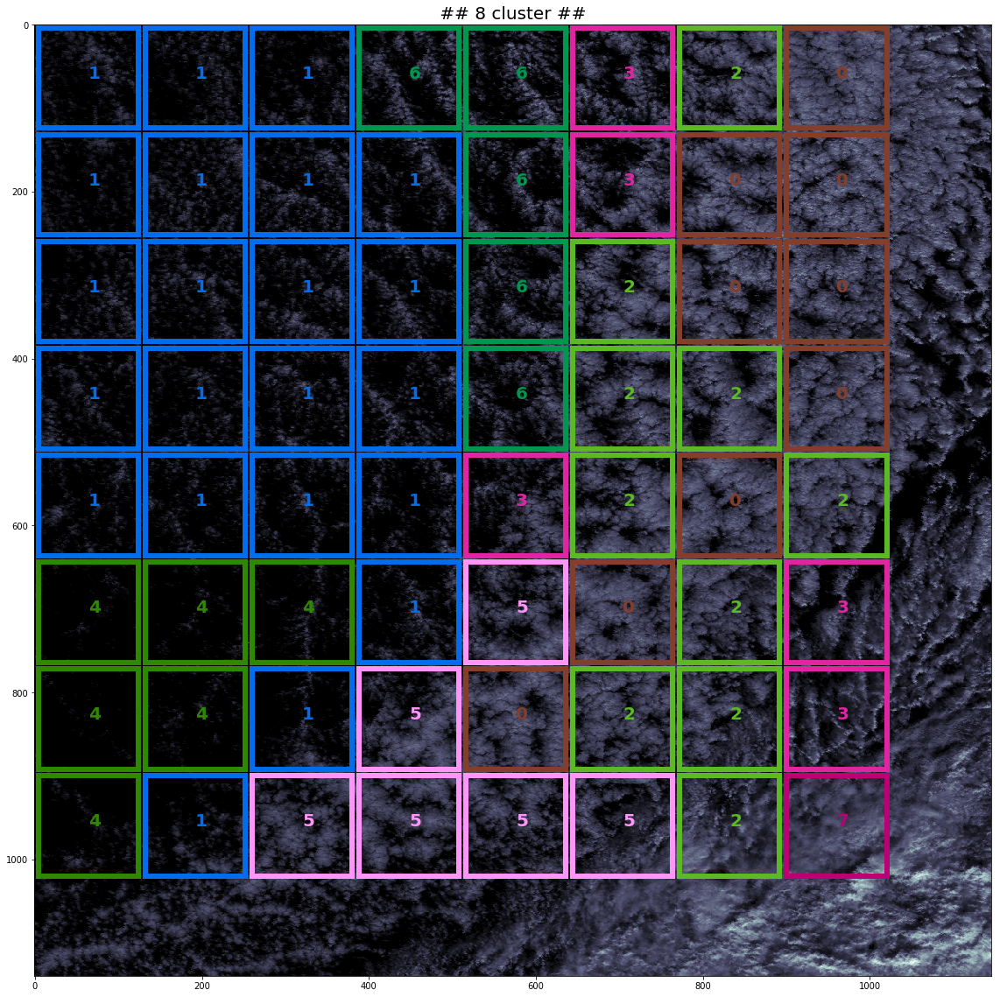

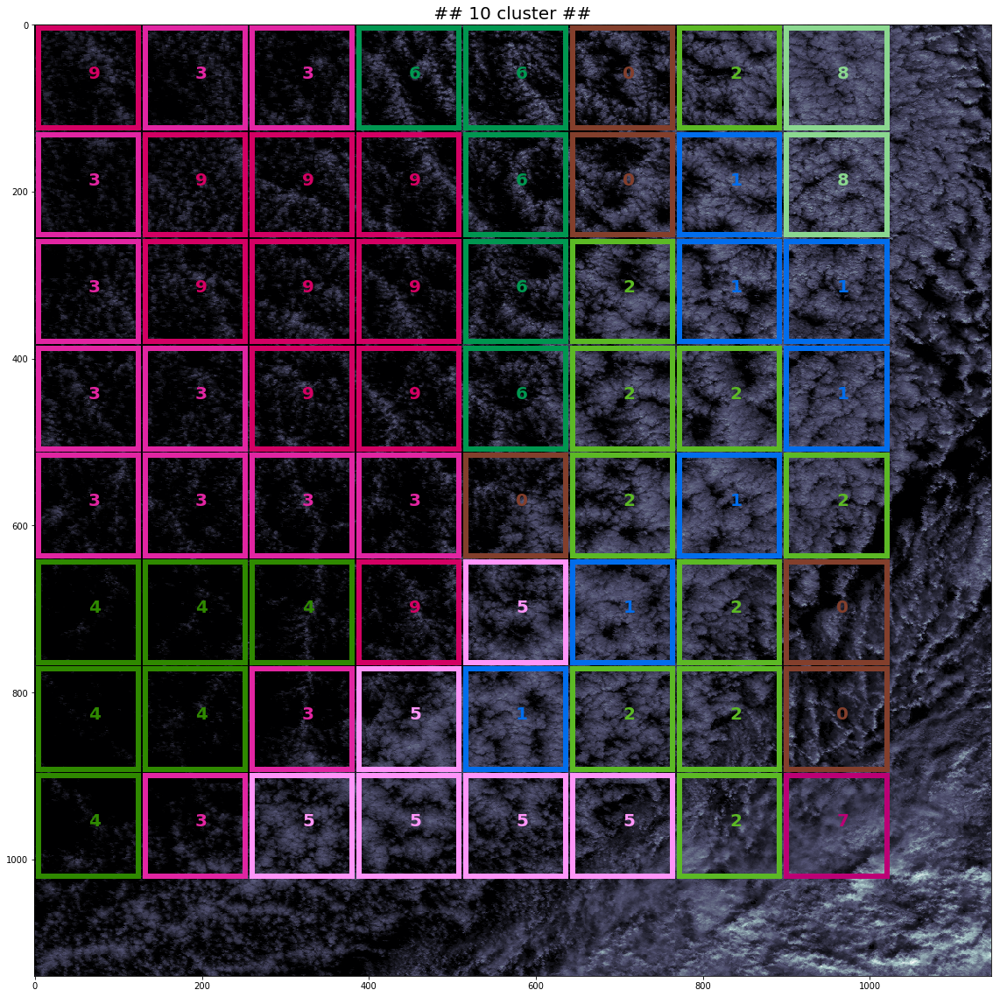

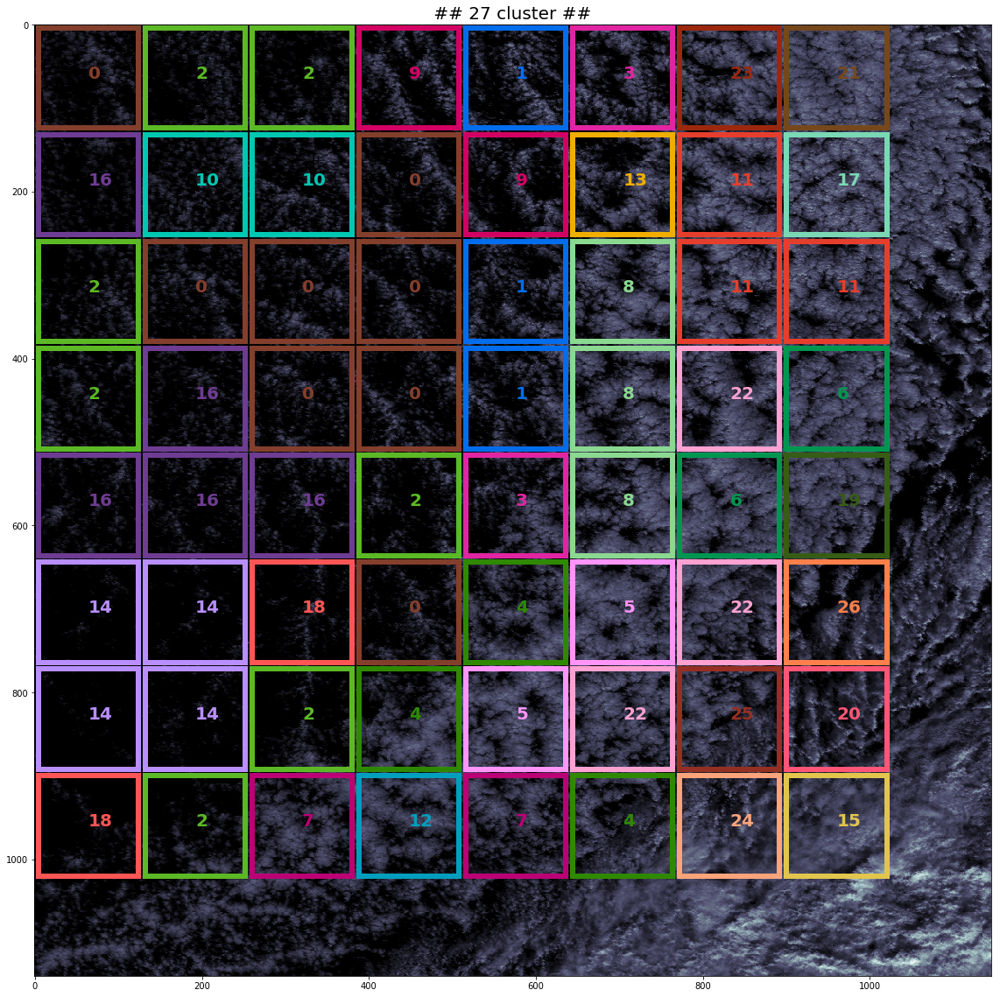

In [61]:
patches = _gen_patches(mod09_data)
for icluster in [2,4,8,10,27]:
    _patches_labels = _anl_agl(encoder, patches, clusters=icluster)
    cluster_plotting(mod09_data, patches,_patches_labels, SHAPE, colors, ncluster=icluster)

### Example: 10 patches

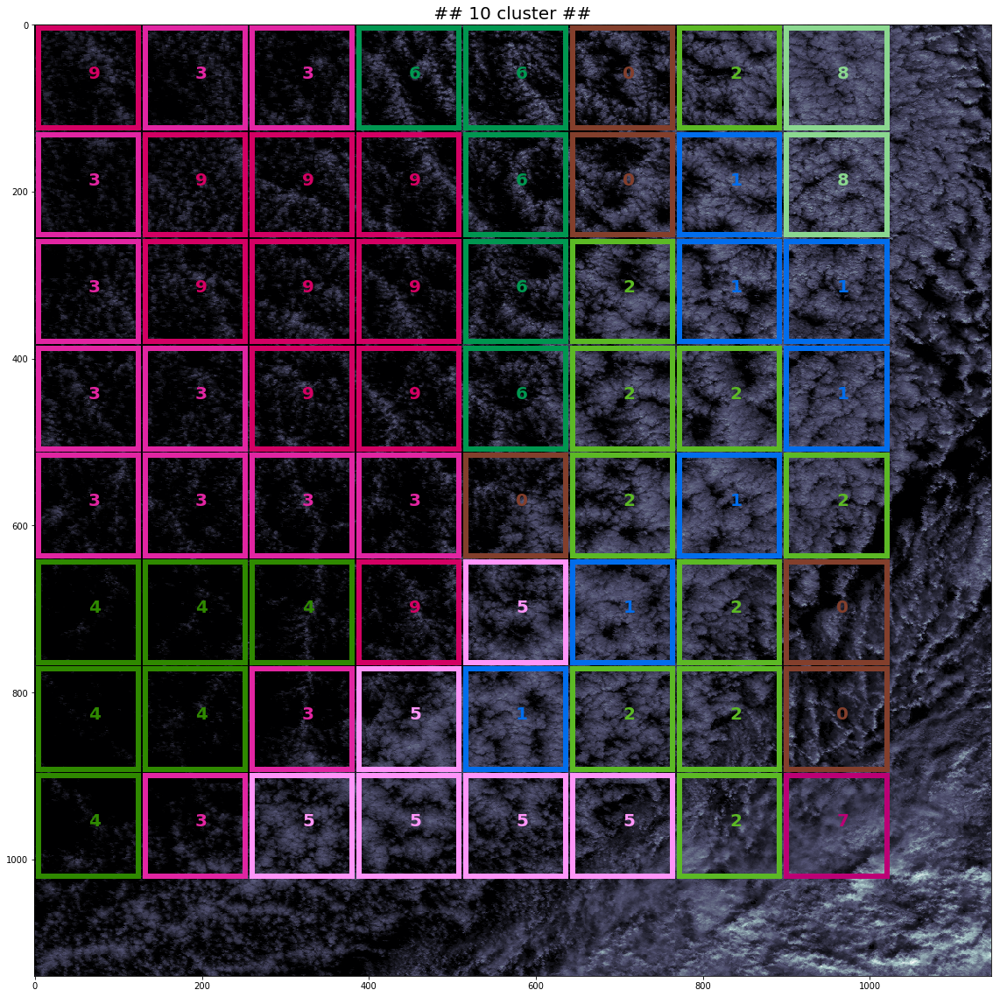

In [62]:
for icluster in [10]:
    _patches_labels = _anl_agl(encoder, patches, clusters=icluster)
    cluster_plotting(mod09_data, patches,_patches_labels, SHAPE, colors, ncluster=icluster)

In [63]:
cot_patches = _gen_patches(int_cot_data)

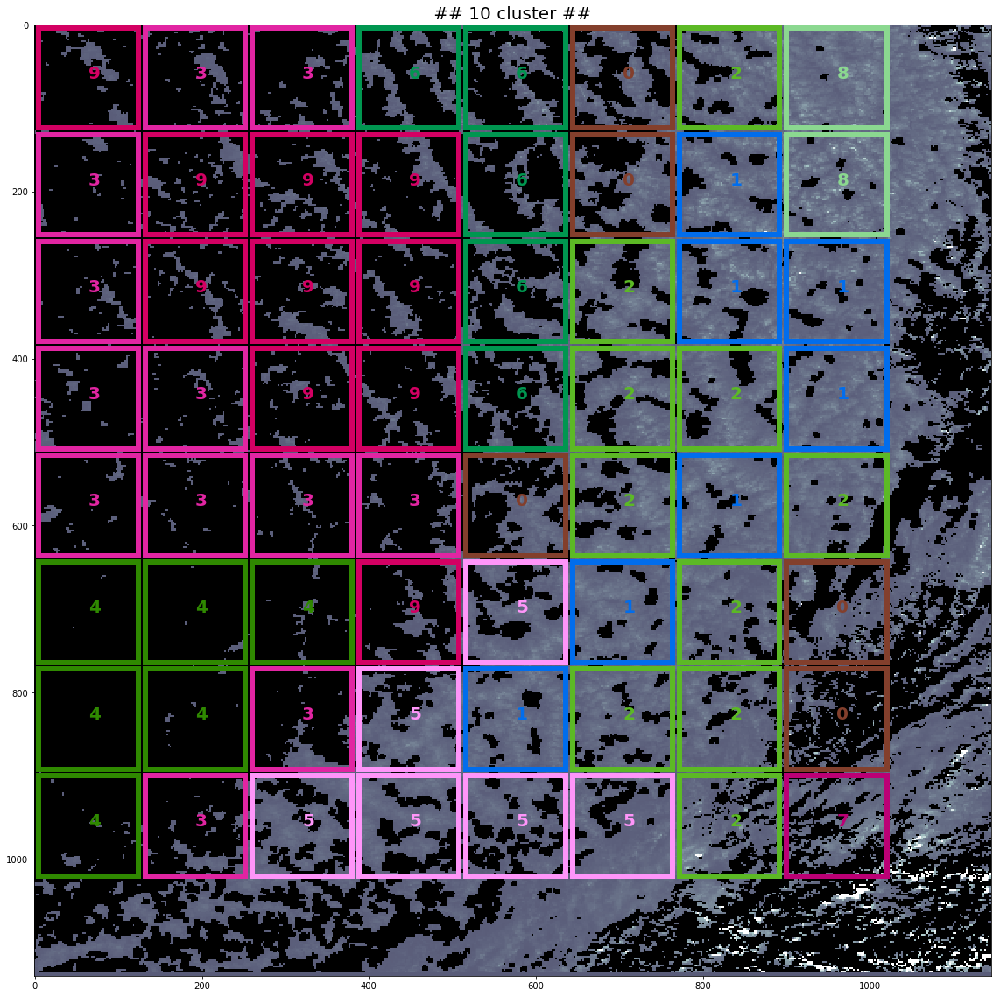

In [65]:
cluster_plotting(int_cot_data.reshape(int_cot_data.shape[0], int_cot_data.shape[1], 1), 
                 cot_patches,_patches_labels, SHAPE, colors, ncluster=10)

In [66]:
cot_patches.shape

(8, 8, 128, 128)

In [68]:
mean_cot_patches = cot_patches.mean(axis=(2,3))

In [70]:
stdv_cot_patches = cot_patches.std(axis=(2,3))

In [78]:
cluster_list = []
for inum in range(10):
    tmp_list = []
    for ix in range(cot_patches.shape[0]):
        for iy in range(cot_patches.shape[1]):
            if _patches_labels[ix,iy] == inum:
                tmp_list.append(mean_cot_patches[ix,iy])
    cluster_list += [tmp_list]

In [83]:
for i in range(10):
    print("=== %d ===" % i )
    print(np.mean(cluster_list[i]))
    print(np.std(cluster_list[i]))

=== 0 ===
0.030822444667909326
0.17050424305361833
=== 1 ===
0.853575275811682
0.05596467362437656
=== 2 ===
0.6570528179912267
0.07624150337736654
=== 3 ===
-0.7192005592895511
0.07847194494899225
=== 4 ===
-0.8714101496333034
0.028618395618710952
=== 5 ===
0.4275429744666168
0.1250907909793648
=== 6 ===
-0.2339907239666254
0.08024193814039254
=== 7 ===
0.2301569359423428
0.0
=== 8 ===
1.0939872062450655
0.034655900185310395
=== 9 ===
-0.5881437343615366
0.0634899752488847


In [90]:
def _listed_cluster_mean(_patches_labels, _patches_mean, icluster=2):
    """ _list [cluster number][mean radiance value]"""
    _list = []
    for i , j in itertools.product(range(patches.shape[0]), range(patches.shape[1])):
        _list+= [[_patches_labels[i,j], _patches_mean[i,j]]]
    return _list

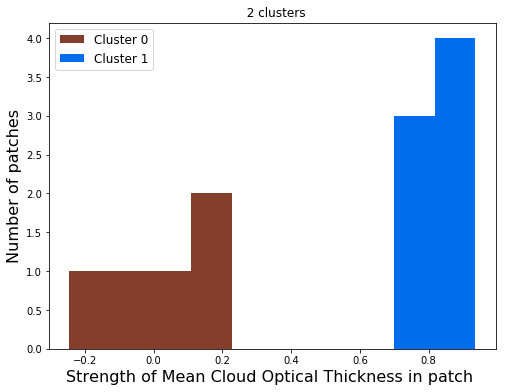

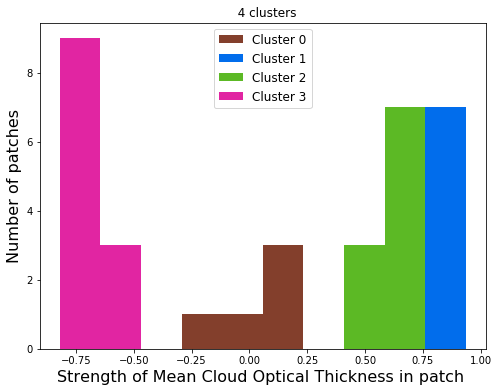

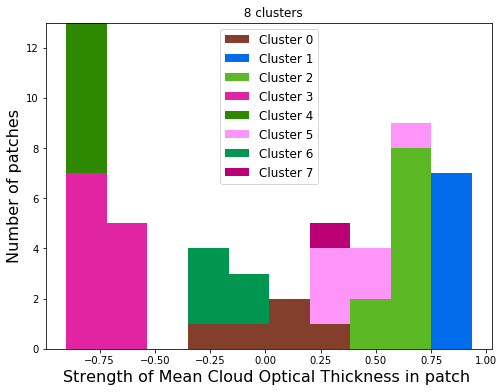

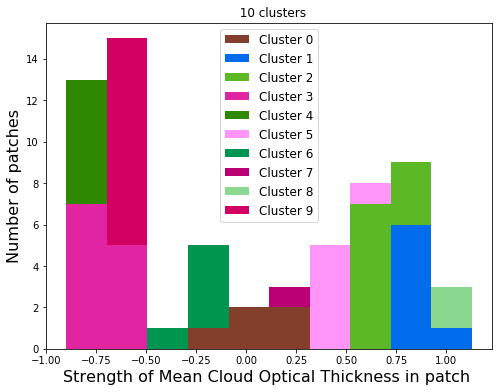

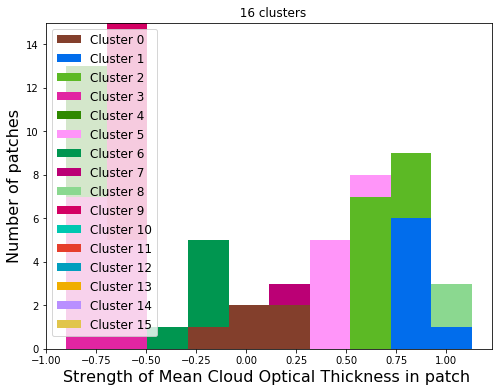

In [93]:
# mean cloud property
for _cluster in [2,4,8,10,16]:
    radiances = _listed_cluster_mean(_patches_labels, mean_cot_patches,icluster=_cluster)
    sorted_radiances = sorted(radiances, key=lambda x : x[1], reverse=True)
    # split list
    clusters_list = []
    labels_list   = []
    for i in range(_cluster):
        clusters_list +=[ [x[1] for x in sorted_radiances if x[0] == i] ]
        labels_list += [ 'Cluster '+str(i)]
    plt.figure(figsize=(8,6))
    plt.hist([ x for x in clusters_list], label=labels_list, 
    color=colors[:_cluster], stacked=True)
    plt.title("  %d clusters" %_cluster)
    plt.xlabel("Strength of Mean Cloud Optical Thickness in patch ", fontsize=16)
    plt.ylabel("Number of patches", fontsize=16)
    plt.legend(fontsize=12)
    plt.show()

## Other variables

In [94]:
int_filelist=[
    "Cloud_Effective_Radius_1621-Cloud_Effective_Radius_1621",
    "Cloud_Water_Path_16-Cloud_Water_Path_16",
    "Cloud_Effective_Emissivity-Cloud_Effective_Emissivity",
    "Cloud_Top_Height-Cloud_Top_Height"
]

In [101]:
int_namelist=[
    "Cloud_Effective_Radius_1621",
    "Cloud_Water_Path_16",
    "Cloud_Effective_Emissivity",
    "Cloud_Top_Height"
]

In [96]:
def _comp_int_patches(ifile, mod09_data):
    _data = _load_tif_data(ifile)
    int_data = _interpolation(_data, xsize=mod09_data.shape[0], ysize=mod09_data.shape[1])
    int_patches = _gen_patches(int_data)
    return int_patches

In [100]:
def _comp_mean_cloud_property(_patches_labels, mean_int_patches, label='XXX'):
    # mean cloud property
    for _cluster in [2,4,8,10,16]:
        radiances = _listed_cluster_mean(_patches_labels, mean_int_patches,icluster=_cluster)
        sorted_radiances = sorted(radiances, key=lambda x : x[1], reverse=True)
        # split list
        clusters_list = []
        labels_list   = []
        for i in range(_cluster):
            clusters_list +=[ [x[1] for x in sorted_radiances if x[0] == i] ]
            labels_list += [ 'Cluster '+str(i)]
        plt.figure(figsize=(8,6))
        plt.hist([ x for x in clusters_list], label=labels_list, 
        color=colors[:_cluster], stacked=True)
        plt.title("  %d clusters" %_cluster)
        plt.xlabel("Strength of Mean %s in patch " % label, fontsize=16)
        plt.ylabel("Number of patches", fontsize=16)
        plt.legend(fontsize=12)
        plt.show()

variable : Cloud_Effective_Radius_1621-Cloud_Effective_Radius_1621


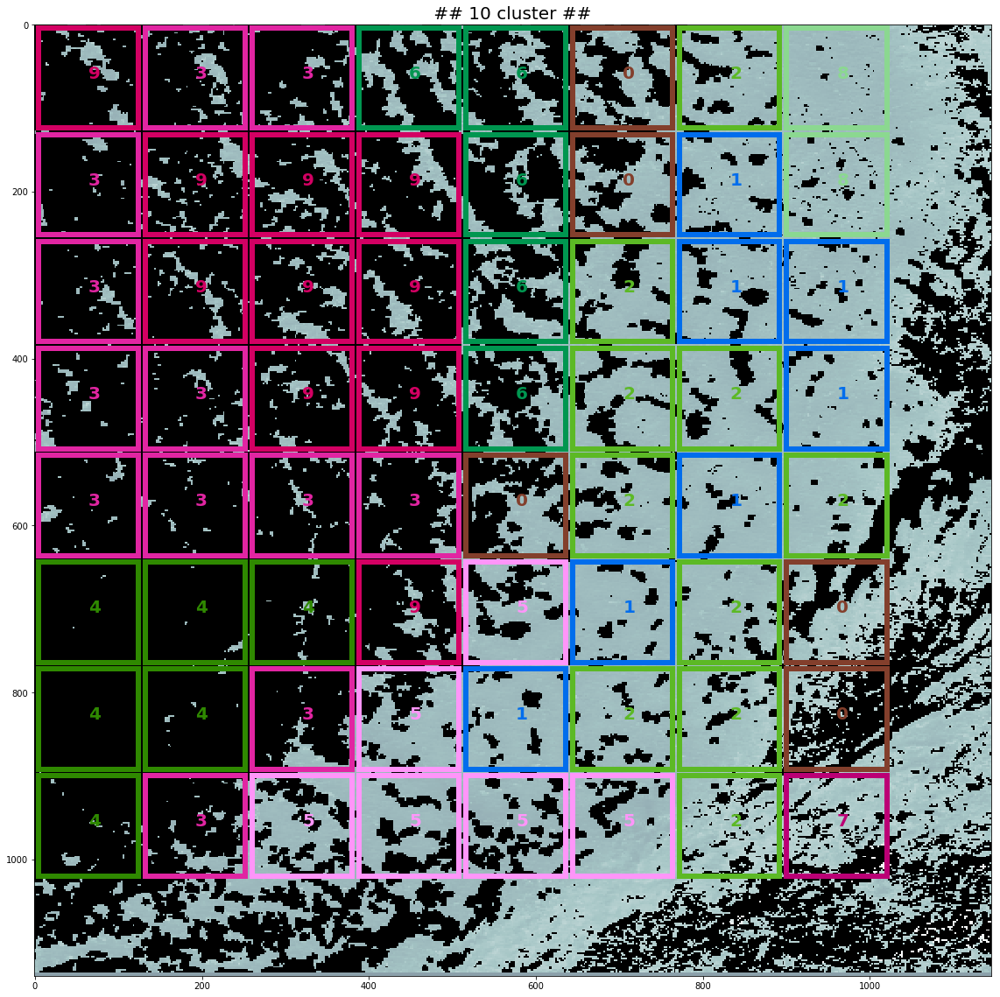

variable : Cloud_Water_Path_16-Cloud_Water_Path_16


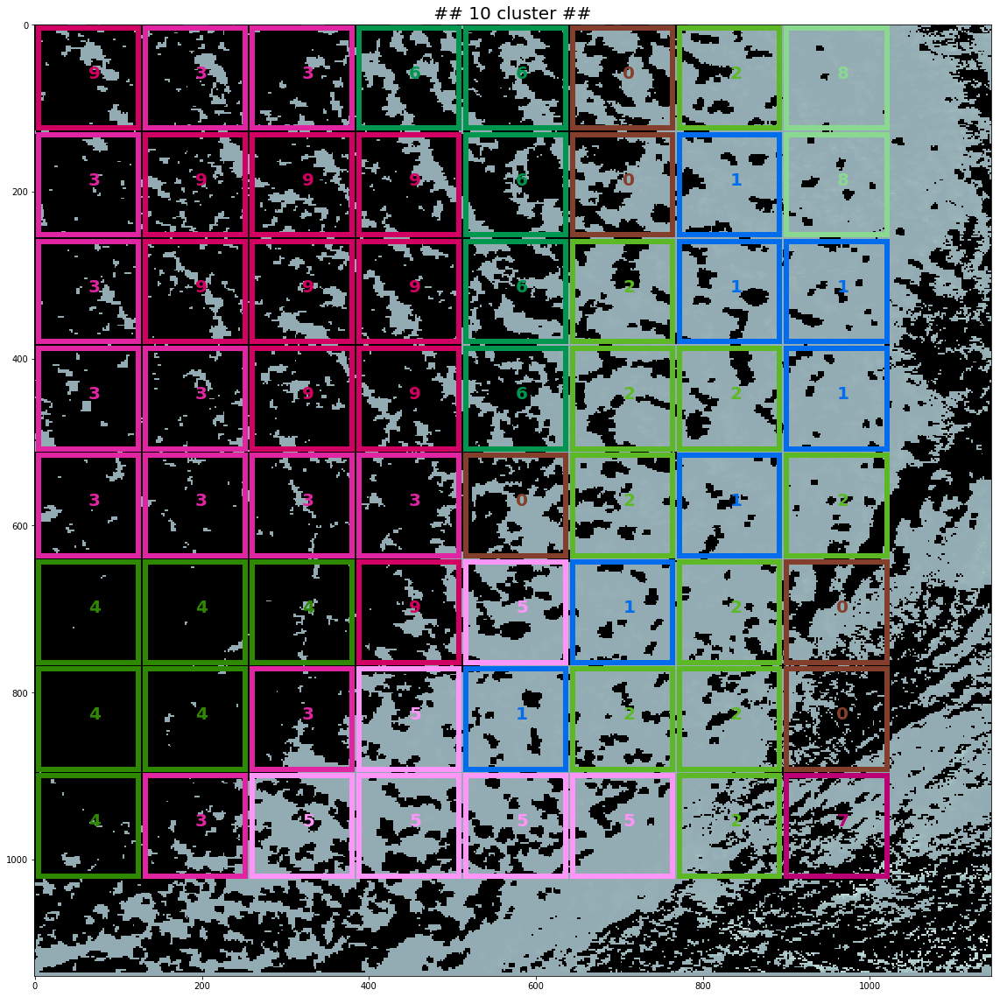

variable : Cloud_Effective_Emissivity-Cloud_Effective_Emissivity


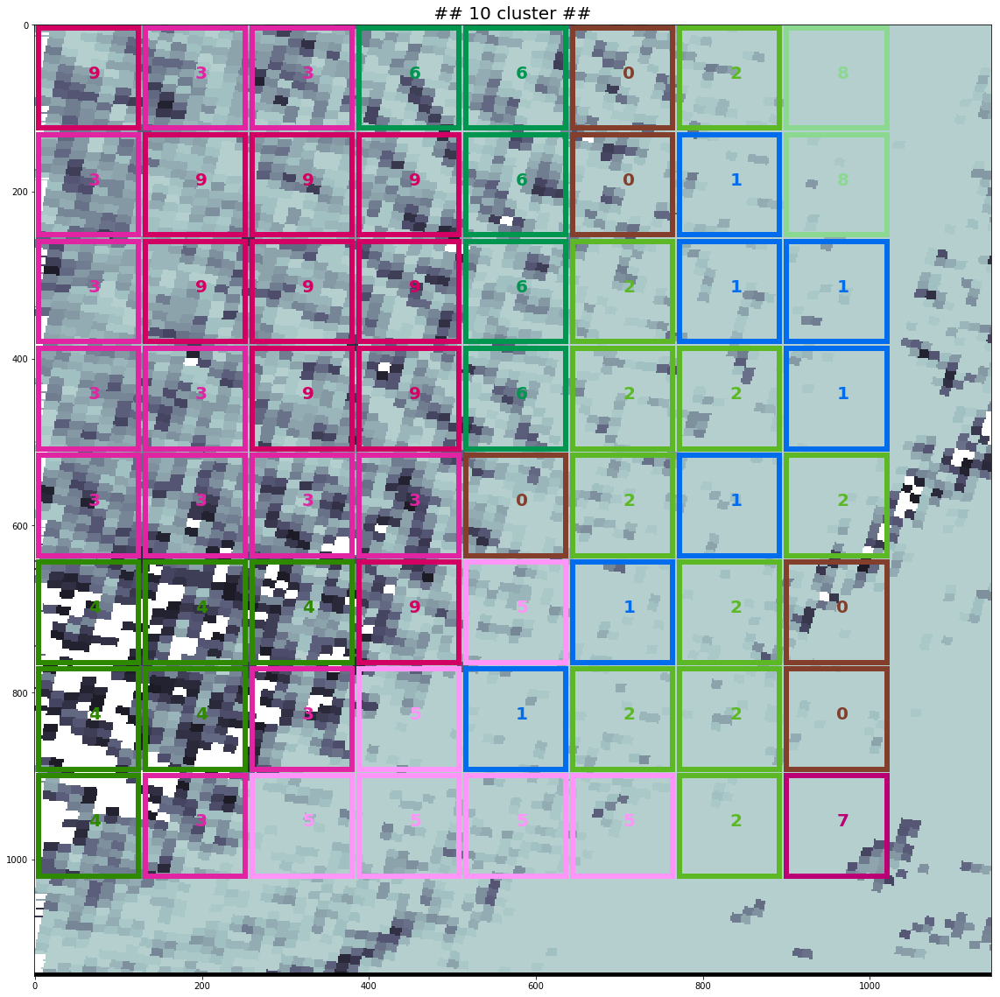

variable : Cloud_Top_Height-Cloud_Top_Height


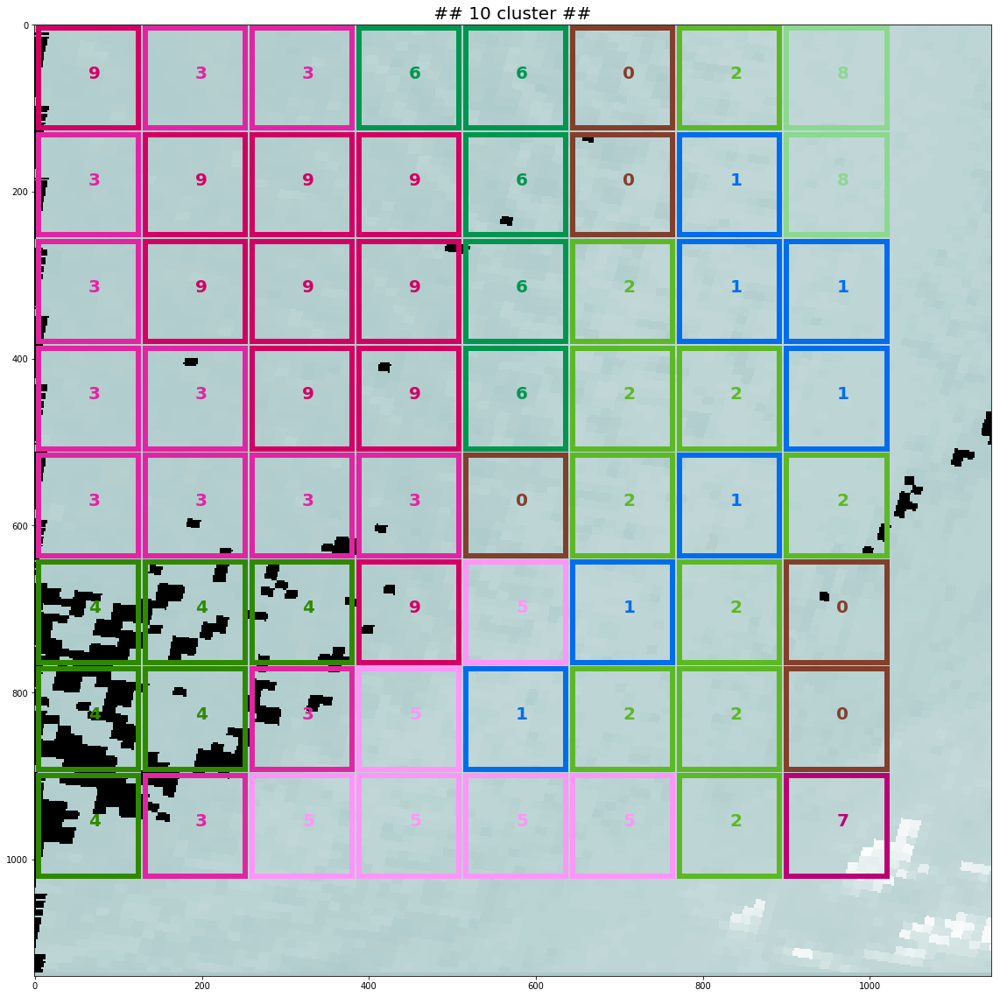

In [104]:
for ifile in int_filelist:
    _data = _load_tif_data(ifile)
    int_data = _interpolation(_data, xsize=mod09_data.shape[0], ysize=mod09_data.shape[1])
    int_patches = _gen_patches(int_data)
    cluster_plotting(int_data.reshape(int_data.shape[0], int_data.shape[1], 1), 
                     int_patches,_patches_labels, SHAPE, colors, ncluster=10)

variable : Cloud_Effective_Radius_1621-Cloud_Effective_Radius_1621


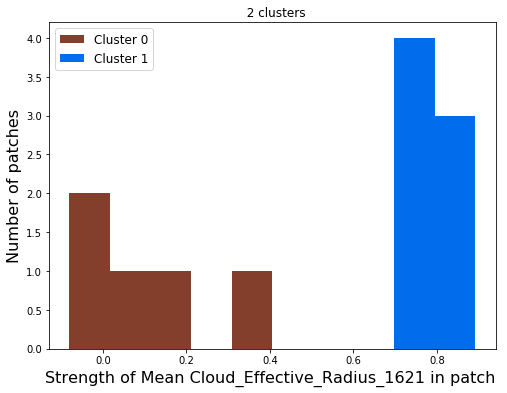

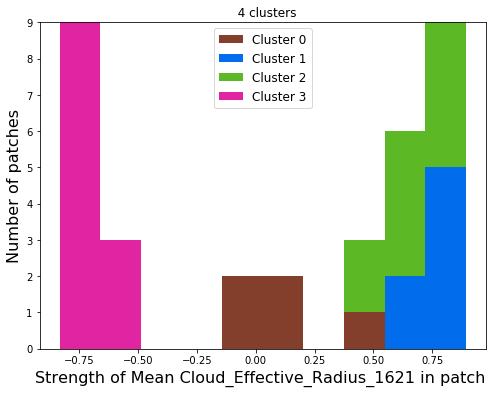

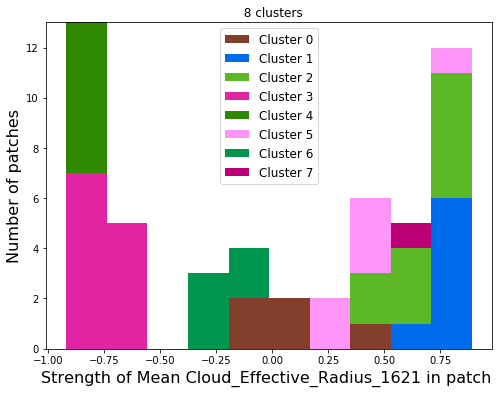

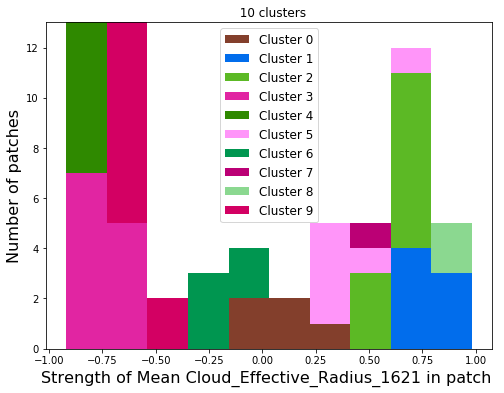

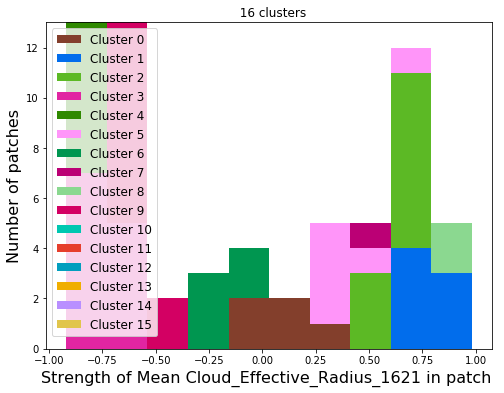

variable : Cloud_Water_Path_16-Cloud_Water_Path_16


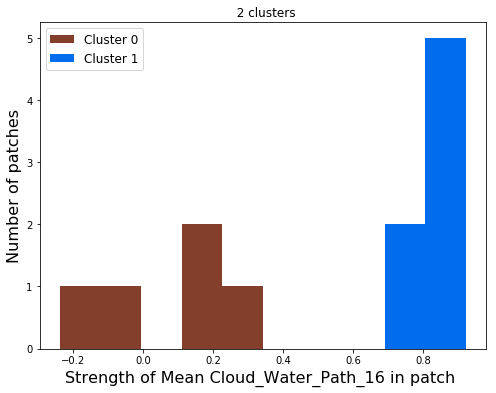

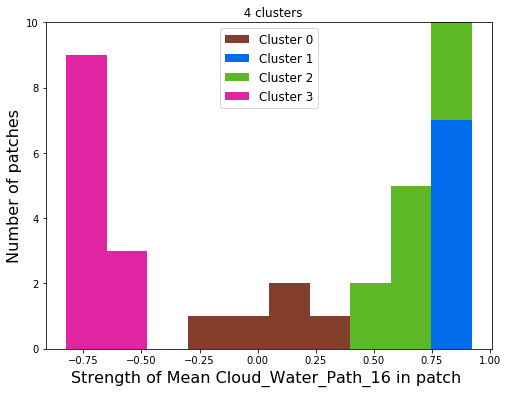

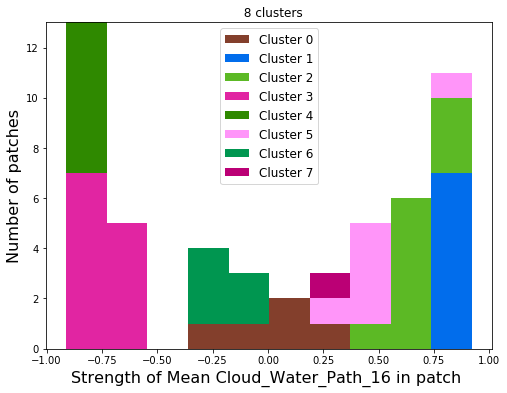

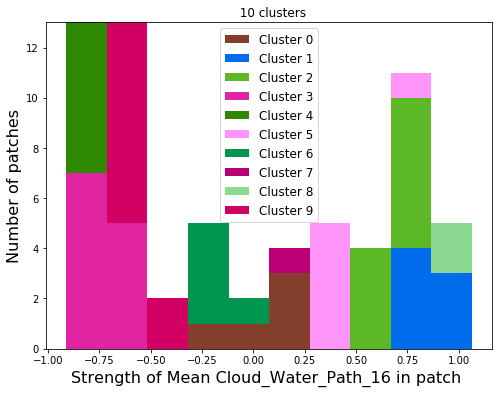

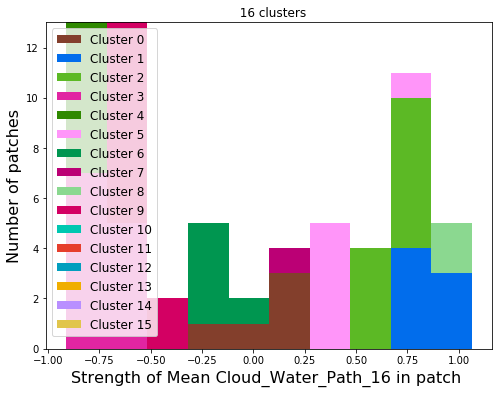

variable : Cloud_Effective_Emissivity-Cloud_Effective_Emissivity


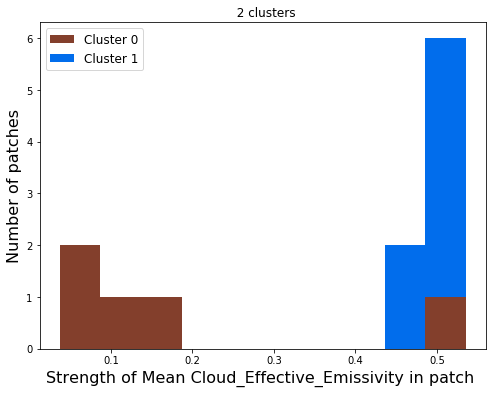

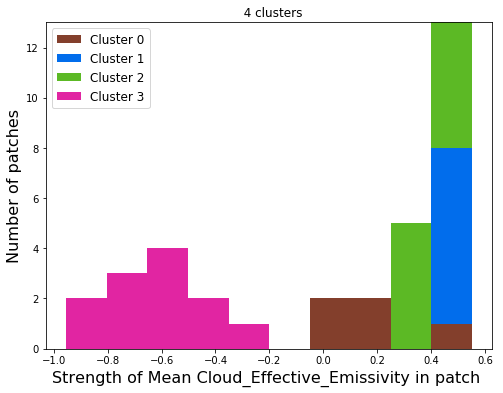

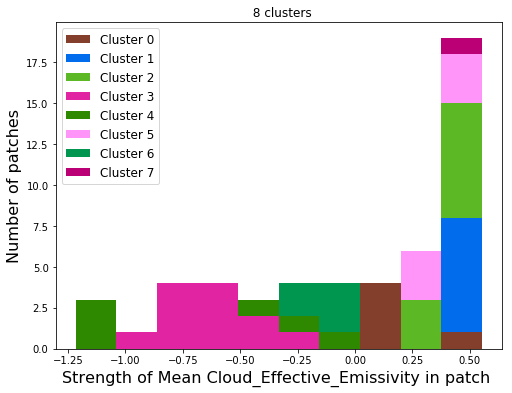

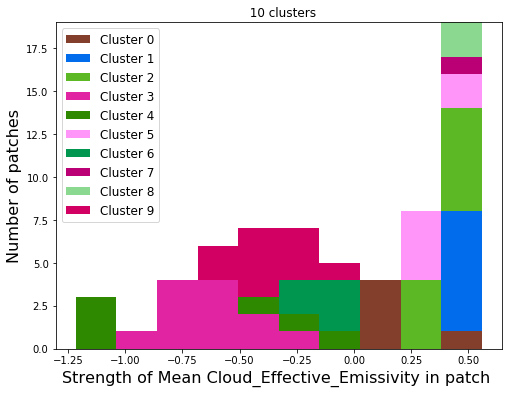

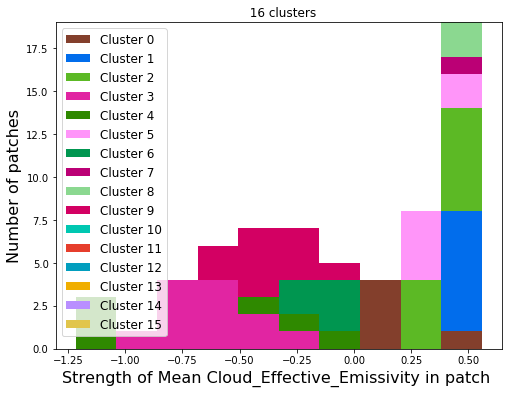

variable : Cloud_Top_Height-Cloud_Top_Height


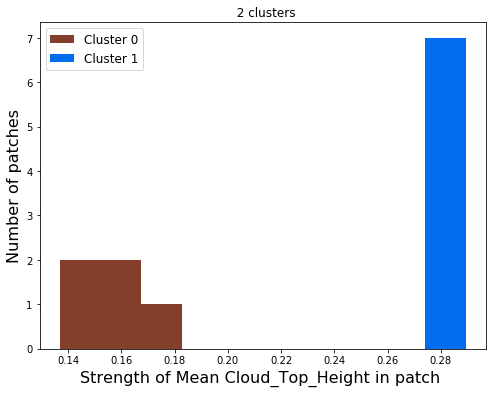

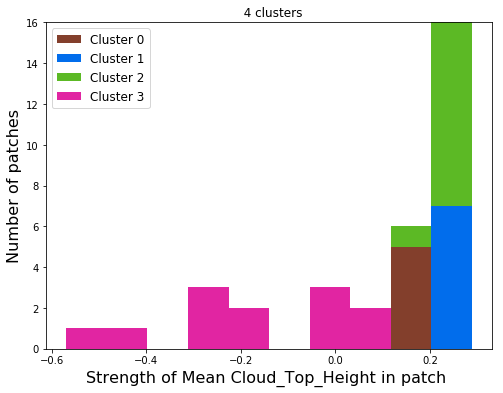

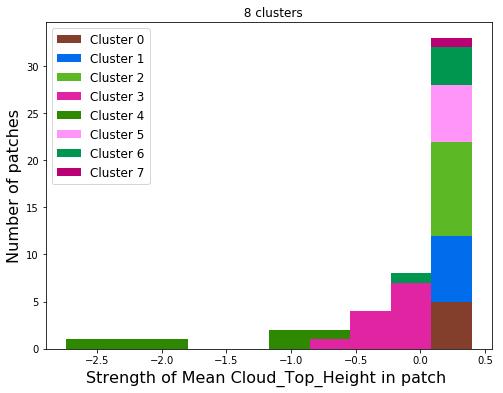

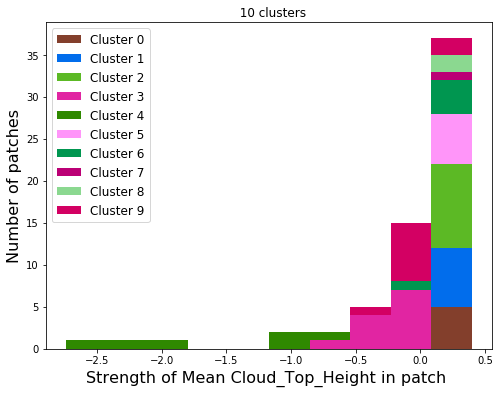

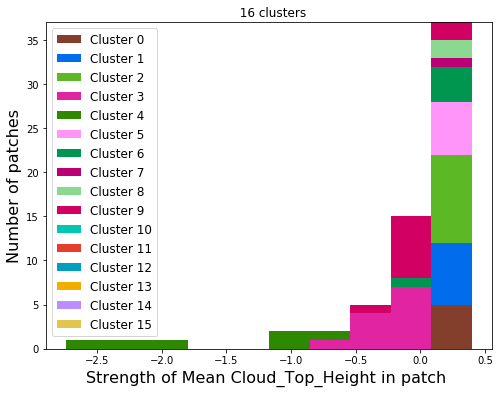

In [102]:
# compare variables and clusterings
for ifile , ilabel in zip(int_filelist, int_namelist):
    int_patches = _comp_int_patches(ifile, mod09_data)
    mean_int_patches = int_patches.mean(axis=(2,3))
    _comp_mean_cloud_property(_patches_labels, mean_int_patches, label=ilabel)